In [1]:
# import

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

C:\ProgramData\Anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
train=pd.read_csv("C:/Users/82102/Desktop/의료/128.치매 고위험군 라이프로그/128.치매 고위험군 라이프로그/01.데이터/train_data.csv")
val=pd.read_csv("C:/Users/82102/Desktop/의료/128.치매 고위험군 라이프로그/128.치매 고위험군 라이프로그/01.데이터/val_data.csv")

In [3]:
train.drop(columns=['Unnamed: 0'], inplace=True)
val.drop(columns=['Unnamed: 0'], inplace=True)

In [4]:
CN_data=train[train['DIAG_NM']=='CN']
MCI_data=train[train['DIAG_NM']=='MCI']
Dem_data=train[train['DIAG_NM']=='Dem']
CN_data=CN_data.reset_index(drop=True)
MCI_data=MCI_data.reset_index(drop=True)
Dem_data=Dem_data.reset_index(drop=True)

# 치매 환자 평균 심박동 변동 시계열

In [5]:
Dem_data

,EMAIL,activity_average_met,activity_cal_active,activity_cal_total,activity_daily_movement,activity_day_end,activity_day_start,activity_high,activity_inactive,activity_inactivity_alerts,...,Q14_1,Q14_2,Q15,Q16_1,Q16_2,Q16_3,Q17,Q18,Q19,TOTAL
0,nia+067@rowan.kr,1.43750,397,2472,7103,2020-10-19T03:59:59+09:00,2020-10-18T04:00:00+09:00,0,636,2,...,2,2,2,1,1,2,1,2,2,16
1,nia+067@rowan.kr,1.37500,366,2398,6881,2020-10-20T03:59:59+09:00,2020-10-19T04:00:00+09:00,0,586,2,...,2,2,2,1,1,2,1,2,2,16
2,nia+067@rowan.kr,1.34375,330,2354,6389,2020-10-21T03:59:59+09:00,2020-10-20T04:00:00+09:00,0,539,1,...,2,2,2,1,1,2,1,2,2,16
3,nia+067@rowan.kr,1.21875,92,2122,1159,2020-10-22T03:59:59+09:00,2020-10-21T04:00:00+09:00,0,647,0,...,2,2,2,1,1,2,1,2,2,16
4,nia+067@rowan.kr,1.25000,206,2188,3755,2020-10-23T03:59:59+09:00,2020-10-22T04:00:00+09:00,0,506,1,...,2,2,2,1,1,2,1,2,2,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,nia+196@rowan.kr,1.00000,14,1845,194,2021-01-02T03:59:59+09:00,2021-01-01T04:00:00+09:00,0,104,0,...,2,2,2,1,2,1,2,1,2,16
567,nia+196@rowan.kr,1.15625,71,2032,1090,2021-01-03T03:59:59+09:00,2021-01-02T04:00:00+09:00,0,581,1,...,2,2,2,1,2,1,2,1,2,16
568,nia+196@rowan.kr,1.21875,207,2162,3726,2021-01-04T03:59:59+09:00,2021-01-03T04:00:00+09:00,2,457,0,...,2,2,2,1,2,1,2,1,2,16
569,nia+196@rowan.kr,1.15625,122,2071,1974,2021-01-05T03:59:59+09:00,2021-01-04T04:00:00+09:00,0,507,0,...,2,2,2,1,2,1,2,1,2,16


In [6]:
Dem_data['sleep_rmssd']

0      25
1      21
2      33
3      28
4      27
       ..
566    33
567    19
568    62
569    42
570    44
Name: sleep_rmssd, Length: 571, dtype: int64

# sleep_rmssd만 확인

In [7]:
Dem_data=Dem_data[['EMAIL','sleep_rmssd']]

In [8]:
Dem_rmssd = {}
for email in Dem_data['EMAIL'].unique():
    Dem_rmssd[email] = Dem_data[Dem_data['EMAIL'] == email]

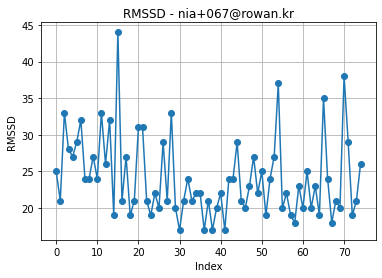

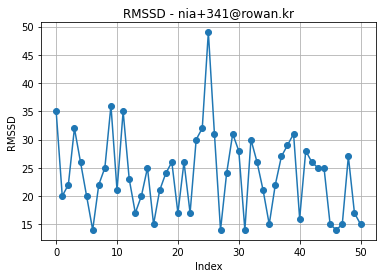

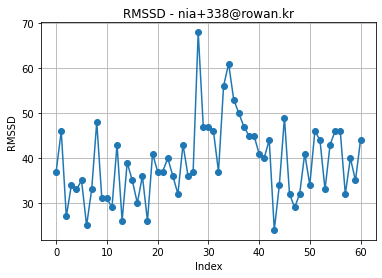

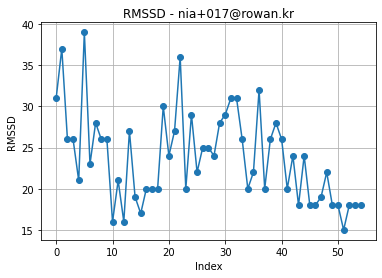

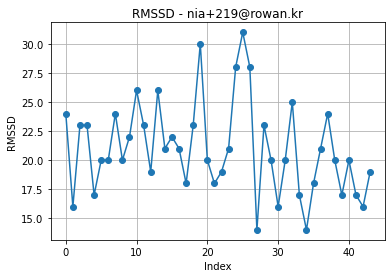

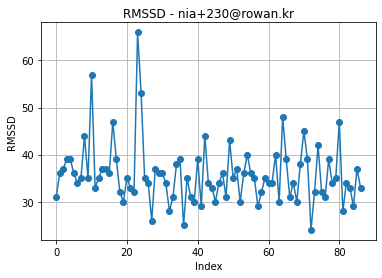

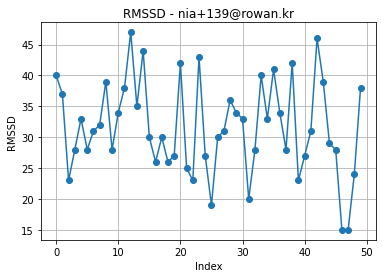

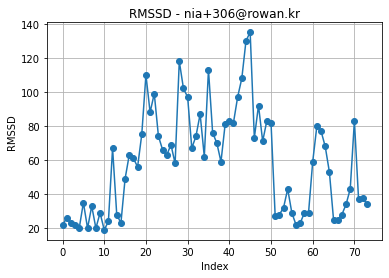

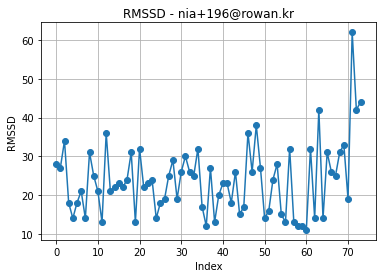

In [9]:
def visualize_rmssd_by_email(email_data):
    plt.plot(email_data.index, email_data['sleep_rmssd'], marker='o', linestyle='-')
    plt.title('RMSSD - ' + email_data['EMAIL'].iloc[0])
    plt.xlabel('Index')
    plt.ylabel('RMSSD')
    plt.grid(True)
    plt.show()

# 각 이메일 주소별로 데이터 추출하여 시각화
for email, data in Dem_rmssd.items():
    data.reset_index(drop=True, inplace=True)
    visualize_rmssd_by_email(data)

# 경증 평균 심박동 변동 시계열

In [10]:
MCI_data=MCI_data[['EMAIL','sleep_rmssd']]

In [11]:
MCI_rmssd = {}
for email in MCI_data['EMAIL'].unique():
    MCI_rmssd[email] = MCI_data[MCI_data['EMAIL'] == email]

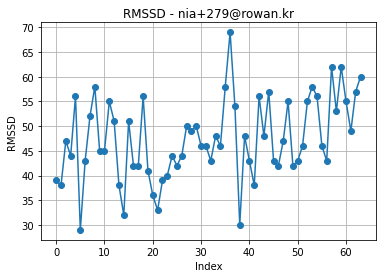

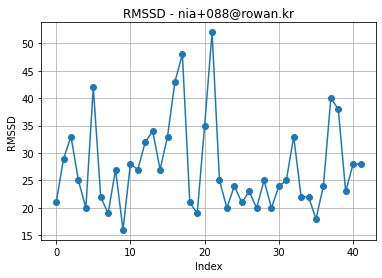

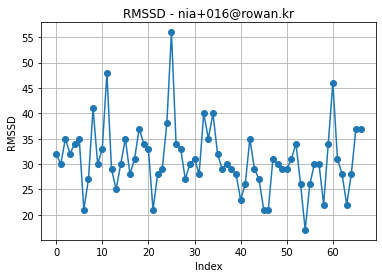

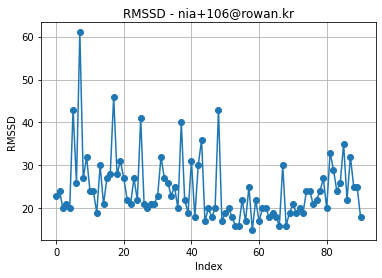

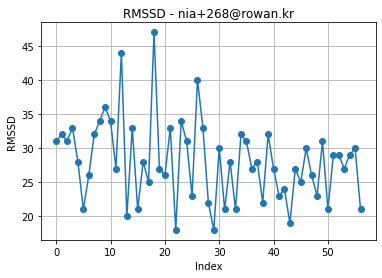

...

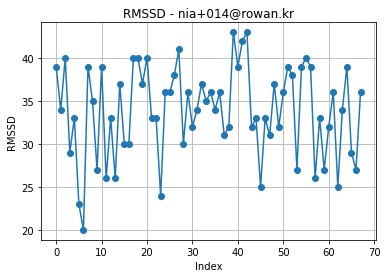

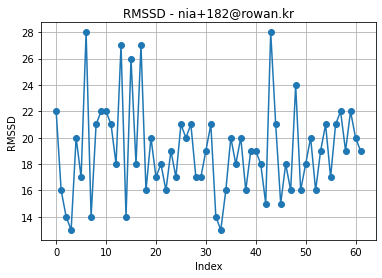

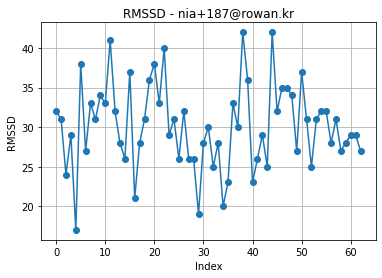

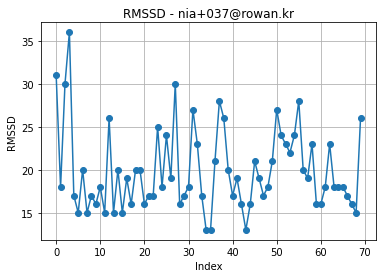

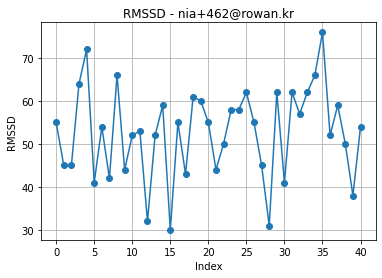

In [12]:
def visualize_rmssd_by_email(email_data):
    plt.plot(email_data.index, email_data['sleep_rmssd'], marker='o', linestyle='-')
    plt.title('RMSSD - ' + email_data['EMAIL'].iloc[0])
    plt.xlabel('Index')
    plt.ylabel('RMSSD')
    plt.grid(True)
    plt.show()

# 각 이메일 주소별로 데이터 추출하여 시각화
for email, data in MCI_rmssd.items():
    data.reset_index(drop=True, inplace=True)
    visualize_rmssd_by_email(data)

# 일반인 평균 심박동 변동 시계열

In [13]:
CN_data=CN_data[['EMAIL','sleep_rmssd']]

In [14]:
CN_rmssd = {}
for email in CN_data['EMAIL'].unique():
    CN_rmssd[email] = CN_data[CN_data['EMAIL'] == email]

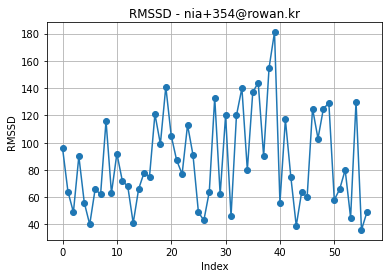

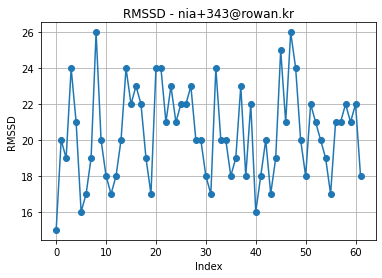

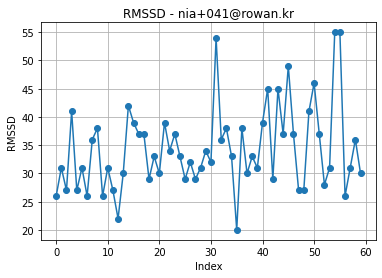

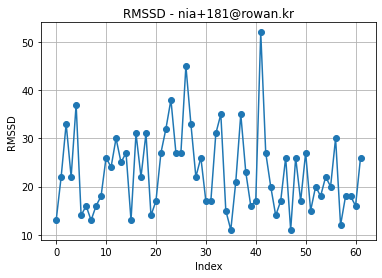

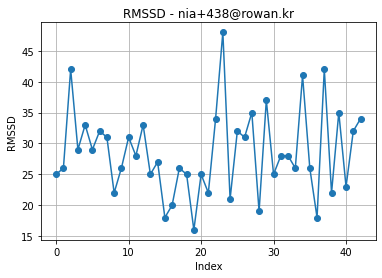

...

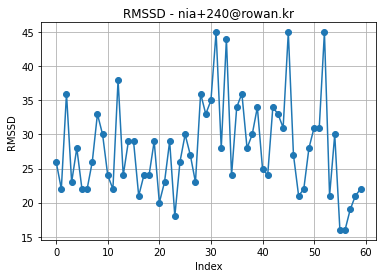

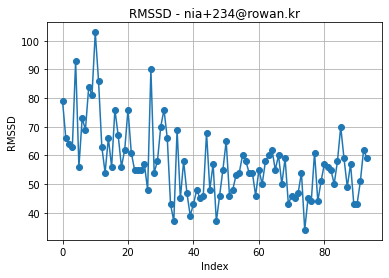

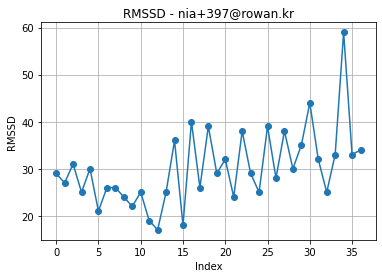

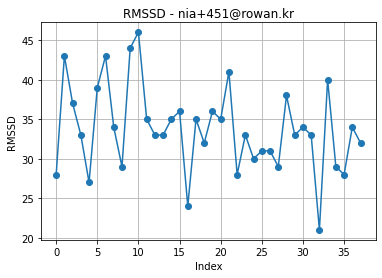

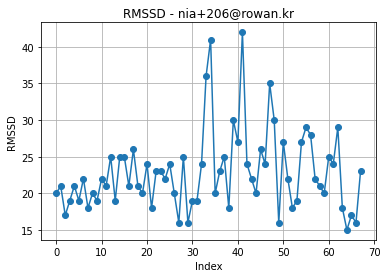

In [15]:
def visualize_rmssd_by_email(email_data):
    plt.plot(email_data.index, email_data['sleep_rmssd'], marker='o', linestyle='-')
    plt.title('RMSSD - ' + email_data['EMAIL'].iloc[0])
    plt.xlabel('Index')
    plt.ylabel('RMSSD')
    plt.grid(True)
    plt.show()

# 각 이메일 주소별로 데이터 추출하여 시각화
for email, data in CN_rmssd.items():
    data.reset_index(drop=True, inplace=True)
    visualize_rmssd_by_email(data)

# k-means clustering으로 유사한 개형의 그래프 3가지 군집으로 분류

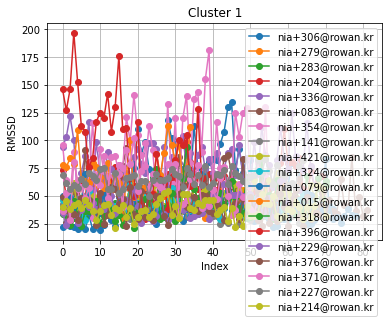

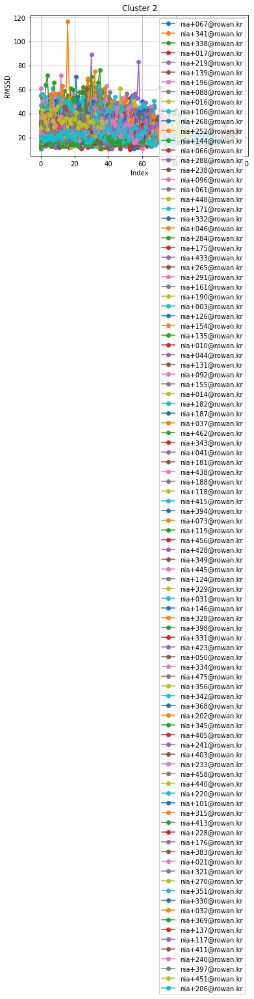

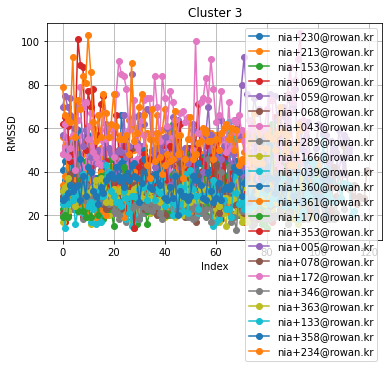

In [16]:
from sklearn.cluster import KMeans
import numpy as np

# 각 데이터를 하나의 배열로 병합
all_data = []
all_lengths = []

# Dem_rmssd 데이터 처리
for email, data in Dem_rmssd.items():
    max_length = max(len(data) for email, data in Dem_rmssd.items())
    padded_data = np.pad(data['sleep_rmssd'].values, (0, max_length - len(data)), mode='constant')
    all_data.append(padded_data)
    all_lengths.append(len(data))

# MCI_rmssd 데이터 처리
for email, data in MCI_rmssd.items():
    max_length = max(len(data) for email, data in MCI_rmssd.items())
    padded_data = np.pad(data['sleep_rmssd'].values, (0, max_length - len(data)), mode='constant')
    all_data.append(padded_data)
    all_lengths.append(len(data))

# CN_rmssd 데이터 처리
for email, data in CN_rmssd.items():
    max_length = max(len(data) for email, data in CN_rmssd.items())
    padded_data = np.pad(data['sleep_rmssd'].values, (0, max_length - len(data)), mode='constant')
    all_data.append(padded_data)
    all_lengths.append(len(data))

# 가장 긴 데이터 길이 구하기
max_length = max(all_lengths)

# 모든 데이터를 동일한 길이로 맞추기 위해 패딩
X = np.array([np.pad(data, (0, max_length - len(data)), mode='constant') for data in all_data])

# 클러스터링 알고리즘 선택
k = 3  # 클러스터 개수
kmeans = KMeans(n_clusters=k, random_state=42)

# 클러스터링 수행
kmeans.fit(X)

# 클러스터링 결과 얻기
labels = kmeans.labels_

# 가장 긴 데이터 길이에 맞춰서 x 축 데이터 생성
x_values = range(max_length)

# 각 클러스터별로 그래프 시각화
for cluster in range(k):
    plt.figure()
    cluster_indices = np.where(labels == cluster)[0]
    for idx in cluster_indices:
        if idx < len(Dem_rmssd):
            data_dict = Dem_rmssd
        elif idx < len(Dem_rmssd) + len(MCI_rmssd):
            data_dict = MCI_rmssd
            idx -= len(Dem_rmssd)
        else:
            data_dict = CN_rmssd
            idx -= len(Dem_rmssd) + len(MCI_rmssd)
        email = list(data_dict.keys())[idx]
        y_values = data_dict[email]['sleep_rmssd']
        plt.plot(x_values[:len(y_values)], y_values, marker='o', linestyle='-', label=email)
    plt.title(f'Cluster {cluster+1}')
    plt.xlabel('Index')
    plt.ylabel('RMSSD')
    plt.legend()
    plt.grid(True)

plt.show()

In [17]:
# 각 클러스터에 속한 이메일이 어느 데이터셋에 속하는지 확인하고 개수 세기
cluster_counts = {'Dem_rmssd': [0] * k, 'MCI_rmssd': [0] * k, 'CN_rmssd': [0] * k}
for cluster in range(k):
    cluster_indices = np.where(labels == cluster)[0]
    for idx in cluster_indices:
        if idx < len(Dem_rmssd):
            cluster_counts['Dem_rmssd'][cluster] += 1
        elif idx < len(Dem_rmssd) + len(MCI_rmssd):
            cluster_counts['MCI_rmssd'][cluster] += 1
        else:
            cluster_counts['CN_rmssd'][cluster] += 1

# 결과 출력
for cluster in range(k):
    print(f"Cluster {cluster+1}: 치매={cluster_counts['Dem_rmssd'][cluster]}, 경증={cluster_counts['MCI_rmssd'][cluster]}, 일반인={cluster_counts['CN_rmssd'][cluster]}")

Cluster 1: 치매=1, 경증=5, 일반인=13
Cluster 2: 치매=7, 경증=36, 일반인=57
Cluster 3: 치매=1, 경증=6, 일반인=15


# 위의 그래프를 시각적으로 확인해 보았을 때, 경향성 차이를 찾지 못함. k-means clustering 방식으로도 그룹화해보았는데, 그냥 골고루 섞여서 나옴

# 다른 변수들도 해보자. sleep_efficiency

In [18]:
CN_data=train[train['DIAG_NM']=='CN']
MCI_data=train[train['DIAG_NM']=='MCI']
Dem_data=train[train['DIAG_NM']=='Dem']
CN_data=CN_data.reset_index(drop=True)
MCI_data=MCI_data.reset_index(drop=True)
Dem_data=Dem_data.reset_index(drop=True)

# 치매

In [19]:
Dem_data=Dem_data[['EMAIL','sleep_efficiency']]

In [20]:
Dem_efficiency = {}
for email in Dem_data['EMAIL'].unique():
    Dem_efficiency[email] = Dem_data[Dem_data['EMAIL'] == email]

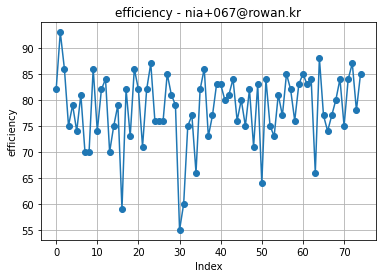

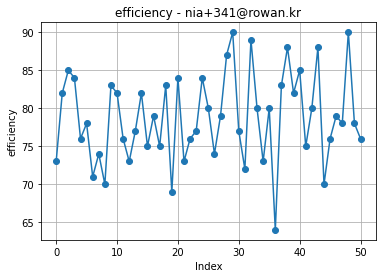

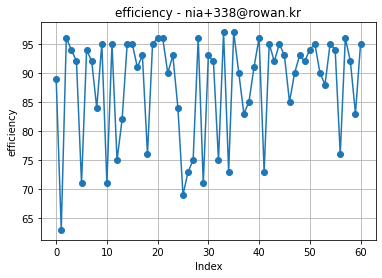

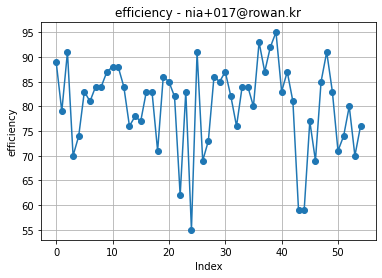

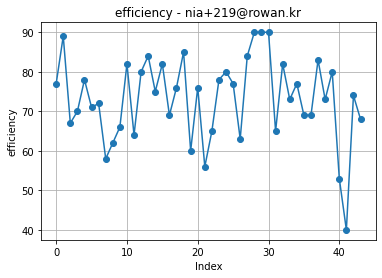

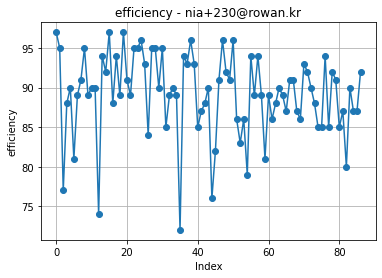

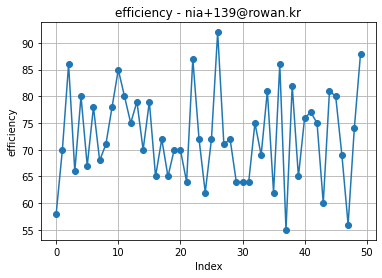

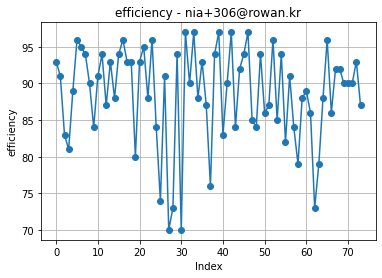

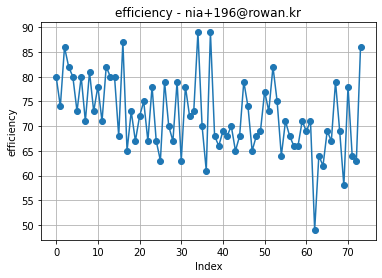

In [21]:
def visualize_efficiency_by_email(email_data):
    plt.plot(email_data.index, email_data['sleep_efficiency'], marker='o', linestyle='-')
    plt.title('efficiency - ' + email_data['EMAIL'].iloc[0])
    plt.xlabel('Index')
    plt.ylabel('efficiency')
    plt.grid(True)
    plt.show()

# 각 이메일 주소별로 데이터 추출하여 시각화
for email, data in Dem_efficiency.items():
    data.reset_index(drop=True, inplace=True)
    visualize_efficiency_by_email(data)

# 경증

In [23]:
MCI_data=MCI_data[['EMAIL','sleep_efficiency']]

In [24]:
MCI_efficiency = {}
for email in MCI_data['EMAIL'].unique():
    MCI_efficiency[email] = MCI_data[MCI_data['EMAIL'] == email]

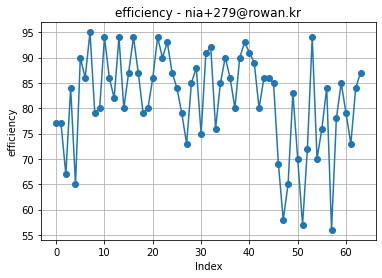

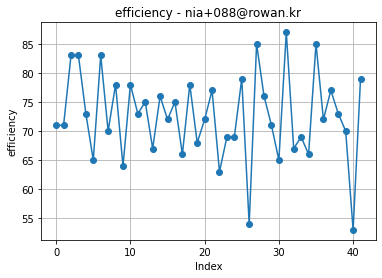

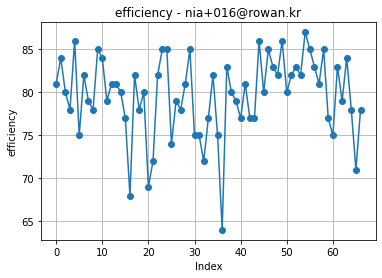

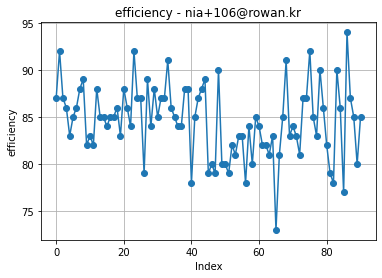

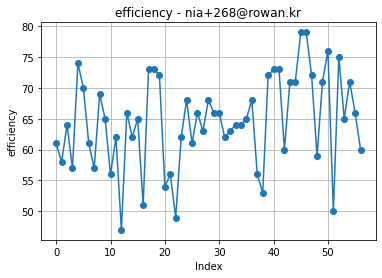

...

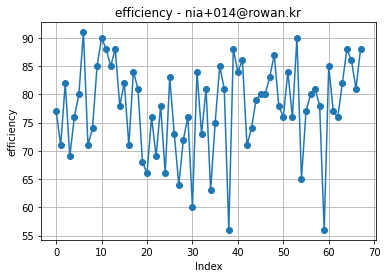

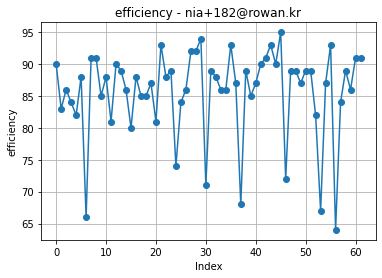

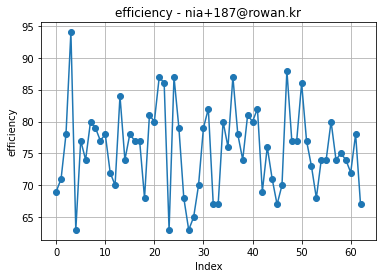

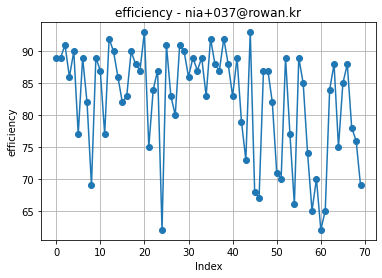

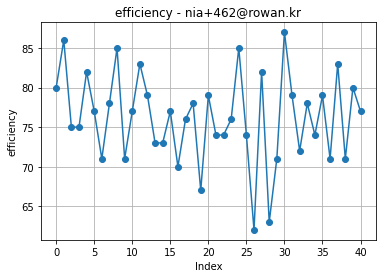

In [25]:
def visualize_efficiency_by_email(email_data):
    plt.plot(email_data.index, email_data['sleep_efficiency'], marker='o', linestyle='-')
    plt.title('efficiency - ' + email_data['EMAIL'].iloc[0])
    plt.xlabel('Index')
    plt.ylabel('efficiency')
    plt.grid(True)
    plt.show()

# 각 이메일 주소별로 데이터 추출하여 시각화
for email, data in MCI_efficiency.items():
    data.reset_index(drop=True, inplace=True)
    visualize_efficiency_by_email(data)

# 일반

In [26]:
CN_data=CN_data[['EMAIL','sleep_efficiency']]

In [27]:
CN_efficiency = {}
for email in CN_data['EMAIL'].unique():
    CN_efficiency[email] = CN_data[CN_data['EMAIL'] == email]

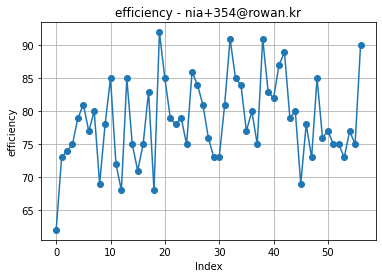

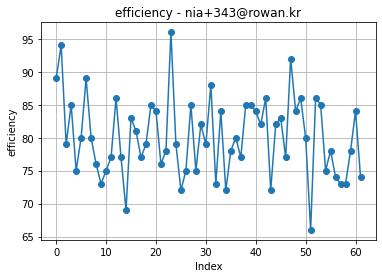

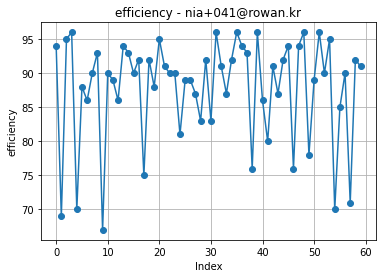

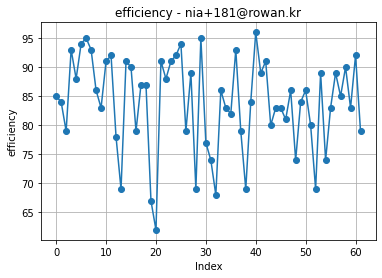

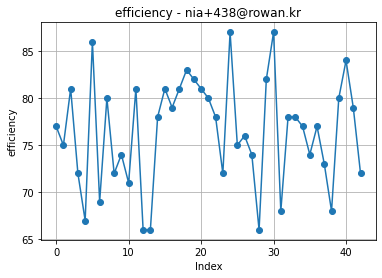

...

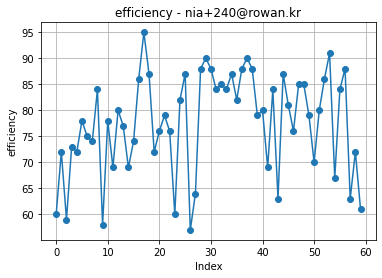

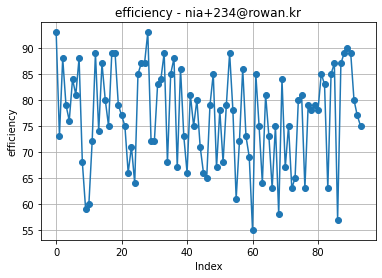

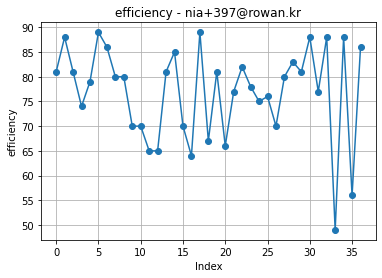

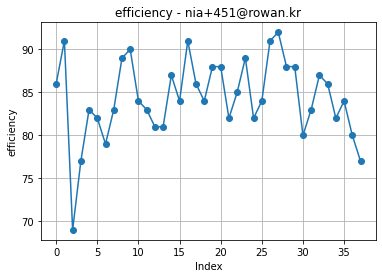

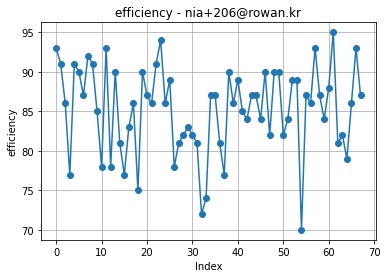

In [28]:
# 각 이메일 주소별로 데이터 추출하여 시각화
for email, data in CN_efficiency.items():
    data.reset_index(drop=True, inplace=True)
    visualize_efficiency_by_email(data)

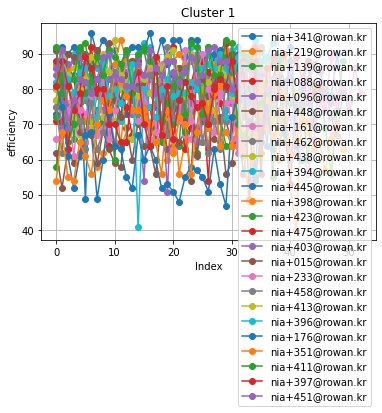

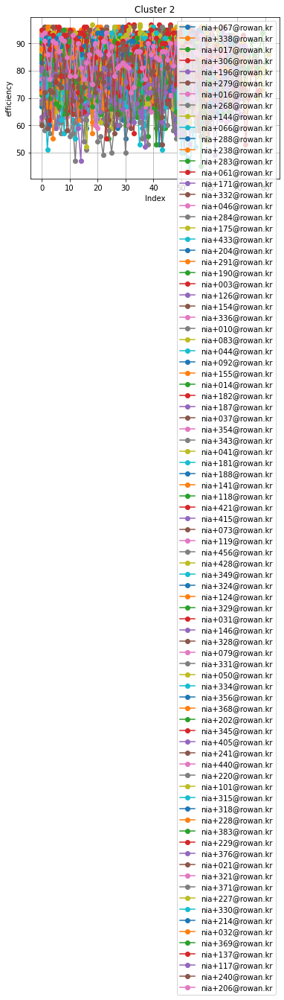

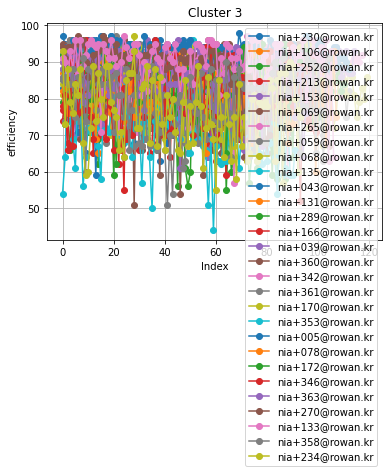

In [30]:
# 각 데이터를 하나의 배열로 병합
all_data = []
all_lengths = []

# Dem_rmssd 데이터 처리
for email, data in Dem_efficiency.items():
    max_length = max(len(data) for email, data in Dem_efficiency.items())
    padded_data = np.pad(data['sleep_efficiency'].values, (0, max_length - len(data)), mode='constant')
    all_data.append(padded_data)
    all_lengths.append(len(data))

# MCI_rmssd 데이터 처리
for email, data in MCI_efficiency.items():
    max_length = max(len(data) for email, data in MCI_efficiency.items())
    padded_data = np.pad(data['sleep_efficiency'].values, (0, max_length - len(data)), mode='constant')
    all_data.append(padded_data)
    all_lengths.append(len(data))

# CN_rmssd 데이터 처리
for email, data in CN_efficiency.items():
    max_length = max(len(data) for email, data in CN_efficiency.items())
    padded_data = np.pad(data['sleep_efficiency'].values, (0, max_length - len(data)), mode='constant')
    all_data.append(padded_data)
    all_lengths.append(len(data))

# 가장 긴 데이터 길이 구하기
max_length = max(all_lengths)

# 모든 데이터를 동일한 길이로 맞추기 위해 패딩
X = np.array([np.pad(data, (0, max_length - len(data)), mode='constant') for data in all_data])

# 클러스터링 알고리즘 선택
k = 3  # 클러스터 개수
kmeans = KMeans(n_clusters=k, random_state=42)

# 클러스터링 수행
kmeans.fit(X)

# 클러스터링 결과 얻기
labels = kmeans.labels_

# 가장 긴 데이터 길이에 맞춰서 x 축 데이터 생성
x_values = range(max_length)

# 각 클러스터별로 그래프 시각화
for cluster in range(k):
    plt.figure()
    cluster_indices = np.where(labels == cluster)[0]
    for idx in cluster_indices:
        if idx < len(Dem_efficiency):
            data_dict = Dem_efficiency
        elif idx < len(Dem_efficiency) + len(MCI_efficiency):
            data_dict = MCI_efficiency
            idx -= len(Dem_efficiency)
        else:
            data_dict = CN_efficiency
            idx -= len(Dem_efficiency) + len(MCI_efficiency)
        email = list(data_dict.keys())[idx]
        y_values = data_dict[email]['sleep_efficiency']
        plt.plot(x_values[:len(y_values)], y_values, marker='o', linestyle='-', label=email)
    plt.title(f'Cluster {cluster+1}')
    plt.xlabel('Index')
    plt.ylabel('efficiency')
    plt.legend()
    plt.grid(True)

plt.show()

In [31]:
cluster_counts = {'Dem_efficiency': [0] * k, 'MCI_efficiency': [0] * k, 'CN_efficiency': [0] * k}
for cluster in range(k):
    cluster_indices = np.where(labels == cluster)[0]
    for idx in cluster_indices:
        if idx < len(Dem_efficiency):
            cluster_counts['Dem_efficiency'][cluster] += 1
        elif idx < len(Dem_efficiency) + len(MCI_efficiency):
            cluster_counts['MCI_efficiency'][cluster] += 1
        else:
            cluster_counts['CN_efficiency'][cluster] += 1

# 결과 출력
for cluster in range(k):
    print(f"Cluster {cluster+1}: 치매={cluster_counts['Dem_efficiency'][cluster]}, 경증={cluster_counts['MCI_efficiency'][cluster]}, 일반인={cluster_counts['CN_efficiency'][cluster]}")

Cluster 1: 치매=3, 경증=5, 일반인=17
Cluster 2: 치매=5, 경증=31, 일반인=51
Cluster 3: 치매=1, 경증=11, 일반인=17


# 수면 효율 변수도 시각적으로나, 군집화 모두 경향성이 없어 보임